In [70]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [71]:
%autoreload 2

In [1]:
import sys
sys.path.append("../code")

In [14]:
from data_prep.mcd_to_adata import mcd_to_anndata, coarse_grain_imc_adata

In [3]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

%matplotlib inline

In [4]:
plt.rcParams["figure.dpi"] = 200
plt.rcParams["figure.facecolor"] = "white"

## Convert MCD to adata

In [9]:
from skimage.morphology import disk
from skimage.filters import difference_of_gaussians, window, gaussian, threshold_otsu, rank


def preprocess_imc_data(adata_, vst_cofactor=5.):
    sc.pp.filter_cells(adata_, min_counts=10)

    adata_.layers["cleaned"] = adata_.X.copy()
    adata_.X = np.arcsinh(adata_.X / vst_cofactor)
    adata_.layers["vst"] = adata_.X.copy()

    maxs = np.percentile(adata_.X, q=99.5, axis=0)
    adata_.X = np.clip(adata_.X, 0, maxs)
    adata_.layers["vst-clipped"] = adata_.X.copy()

    X = (adata.layers["cleaned"].copy() - 1)**2
    maxs = np.percentile(X, q=99.5, axis=0)
    X[X < 2] = 0
    X = np.clip(X, 0, maxs)
    adata.layers["dog"] = X

In [5]:
mcd_file = Path("/projects/robson-lab/research/imc/data/endo/E07.mcd")

In [6]:
e07 = mcd_to_anndata(mcd_file, "E07", acquisition_label=2)

In [10]:
preprocess_imc_data(eu106_11)

In [64]:
xs, ys = e07.obsm["X_spatial"].T

In [83]:
dna = eu106_11[:, ["DNA1", "DNA3"]].layers["cleaned"].sum(axis=1)

In [94]:
rotmat = lambda t: np.array([[np.cos(t*180/np.pi), -np.sin(t*180/np.pi)],[np.sin(t*180/np.pi), np.cos(t*180/np.pi)]])

In [117]:
e07.obsm["X_spatial_rot"] = (rotmat(30) @ e07.obsm["X_spatial"].T).T

In [118]:
xs, ys = e07.obsm["X_spatial_rot"].T

In [148]:
trim_idx = \
    (xs < xs.max() * 0.25) & \
    (xs > xs.min() * 0.5)

In [149]:
adata = e07[trim_idx, :].copy()

In [150]:
preprocess_imc_data(adata)

In [151]:
gene_sets = {
    "Stromal cells": ["CollagenI", "CD90", "OGN", "aSMA", "PDPN", "CD10", "SFRP2"],
    "Endothelial cells": ["CD31", "AQP1", "PDPN"],
    "Epithelial cells": ["Epcam-ECadherin", "PanCK", "Acetylated-Tubulin"],
    "Lymphocytes cells": ["CD45", "CD3", "CD4", "CD8a", "FoxP3", "CD20", "CD56", "CD66b"],
    "Myeloid cells": ["CD45", "CD68", "HLA-DR"],#, "CD1c", "CD207"],
    "Other": ["Ki67", "pS6", "CollagenI", "DNA1/DNA3"],
}

In [153]:
_ = sc.get.obs_df(adata, ["DNA1", "DNA3"], layer="vst")
adata.obs["DNA1/DNA3"] = _["DNA1"] + _["DNA3"]

In [ ]:
test_set = ["CD8a", "CollagenI", "CD1c", "CD45"]

CD8a plotted
CollagenI plotted
CD1c plotted
CD45 plotted


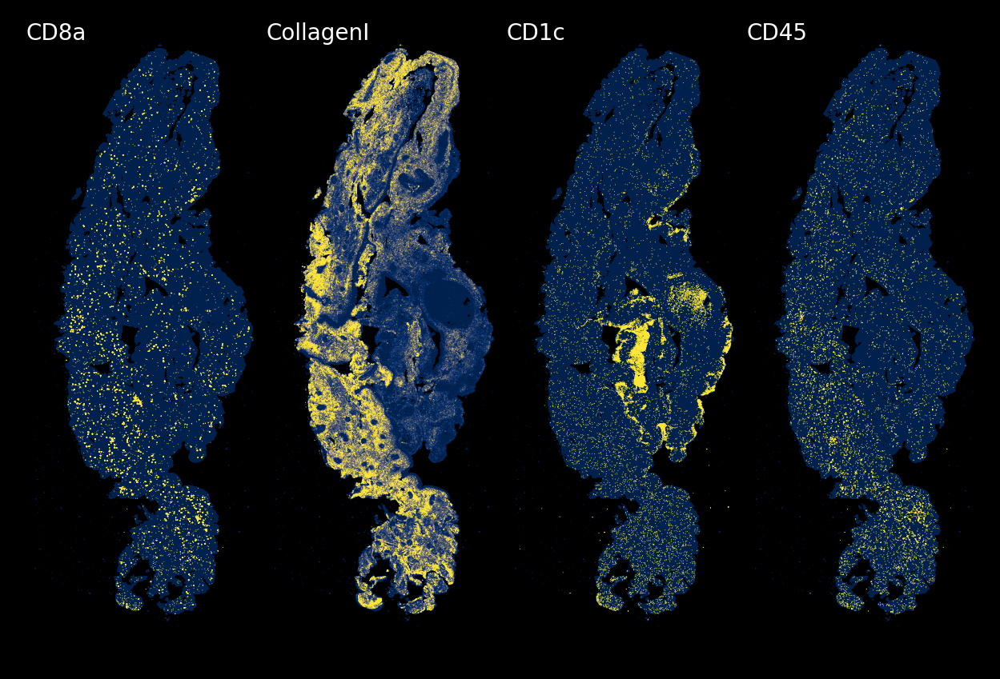

In [158]:
fig, axs = plt.subplots(1, 4, figsize=(6, 4), 
                        gridspec_kw={"left": 0, "right": 1, "top": 1, "bottom": 0, "hspace":0, "wspace":0}, 
                        facecolor="black")
for ax, gene in zip(axs.flat, test_set):
    ax.set_facecolor("black")
            
    sc.pl.scatter(adata, color=gene, layers="dog", 
                  basis="spatial_rot", title="", show=False, ax=ax, size=0.5, color_map="cividis", legend_loc="none",)
    ax.invert_yaxis()
    ax.set_xlabel(""); ax.set_ylabel("");
    ax.text(0.01, 0.99, gene, transform=ax.transAxes, va="top", ha="left", color="white")
    fig.get_children()[-1].remove()
    print(f"{gene} plotted")

In [161]:
figdir = Path("../figures/imc-panels")
if not figdir.exists():
    figdir.mkdir(parents=True)

In [170]:
sc.settings._vector_friendly = True

In [193]:
def plot_imc_marker(imc, marker, layer="dog"):
    fig, ax = plt.subplots(
        1, 1, figsize=(1.5, 4), dpi=300, 
        gridspec_kw={"left": 0, "right": 1, "top": 1, "bottom": 0, "hspace":0, "wspace":0}, 
        facecolor="black"
    )
    ax.set_facecolor("black")
    
    if marker == "DNA1-DNA3":
        _ = sc.get.obs_df(imc, ["DNA1", "DNA3"], layer=layer).sum(axis=1)
        m = np.percentile(_, q=99.5, axis=0)

        imc.obs["DNA1-DNA3"] = np.clip(_, 0, m)

    sc.pl.scatter(
        imc, color=marker, layers=layer, 
        basis="spatial_rot", title="", show=False, 
        ax=ax, size=0.5, color_map="cividis", legend_loc="none"
    )
    
    ax.invert_yaxis()
    ax.set_xlabel(""); ax.set_ylabel("");
    fig.get_children()[-1].remove()
    print(marker)
    sample_name = list(imc.uns["spatial"].keys())[0]
    fname = f"{sample_name}_A002_{marker}.png"
    fig.savefig(figdir / fname, dpi=300)
    print(marker, " saved")
    return fig

In [ ]:
fig = plot_imc_marker(adata, "DNA3", "vst")

In [175]:
for gene in adata.var_names.difference(["DNA3", "DNA1"]).union(["DNA1-DNA3"]):
    fig, ax = plt.subplots(
        1, 1, figsize=(1.5, 4), dpi=300, 
        gridspec_kw={"left": 0, "right": 1, "top": 1, "bottom": 0, "hspace":0, "wspace":0}, facecolor="black"
    )
    
    if gene == "DNA1-DNA3":
        _ = sc.get.obs_df(adata, ["DNA1", "DNA3"], layer="dog")
        adata.obs["DNA1-DNA3"] = _["DNA1"] + _["DNA3"]
    
    ax.set_facecolor("black")

    sc.pl.scatter(adata, color=gene, layers="dog", 
                  basis="spatial_rot", title="", show=False, ax=ax, size=0.5, color_map="cividis", legend_loc="none")
    ax.invert_yaxis()
    ax.set_xlabel(""); ax.set_ylabel("");

    fig.get_children()[-1].remove()
    print(gene)
    sample_name = list(adata.uns["spatial"].keys())[0]
    fname = f"{sample_name}_A002_{gene}.png"
    fig.savefig(figdir / fname, dpi=300)
    print(gene, " saved")
    plt.close()

AQP1
AQP1  saved
Acetylated-Tubulin
Acetylated-Tubulin  saved
CD10
CD10  saved
CD103
CD103  saved
CD1c
CD1c  saved
CD20
CD20  saved
CD207
CD207  saved
CD3
CD3  saved
CD31
CD31  saved
CD4
CD4  saved
CD45
CD45  saved
CD56
CD56  saved
CD66b
CD66b  saved
CD68
CD68  saved
CD8a
CD8a  saved
CD90
CD90  saved
CollagenI
CollagenI  saved
DNA1-DNA3
DNA1-DNA3  saved
Epcam-ECadherin
Epcam-ECadherin  saved
FoxP3
FoxP3  saved
GP9.5
GP9.5  saved
HLA-ABC
HLA-ABC  saved
HLA-DR
HLA-DR  saved
Ki67
Ki67  saved
LYVE1
LYVE1  saved
MUC5B
MUC5B  saved
Nkp44
Nkp44  saved
OGN
OGN  saved
PDPN
PDPN  saved
PanCK
PanCK  saved
SFRP2
SFRP2  saved
SIX1
SIX1  saved
Tryptase
Tryptase  saved
UPK3B
UPK3B  saved
aSMA
aSMA  saved
pS6
pS6  saved


Stromal cells plotted
Endothelial cells plotted
Epithelial cells plotted
Lymphocytes cells plotted
Myeloid cells plotted
Other plotted
saving...


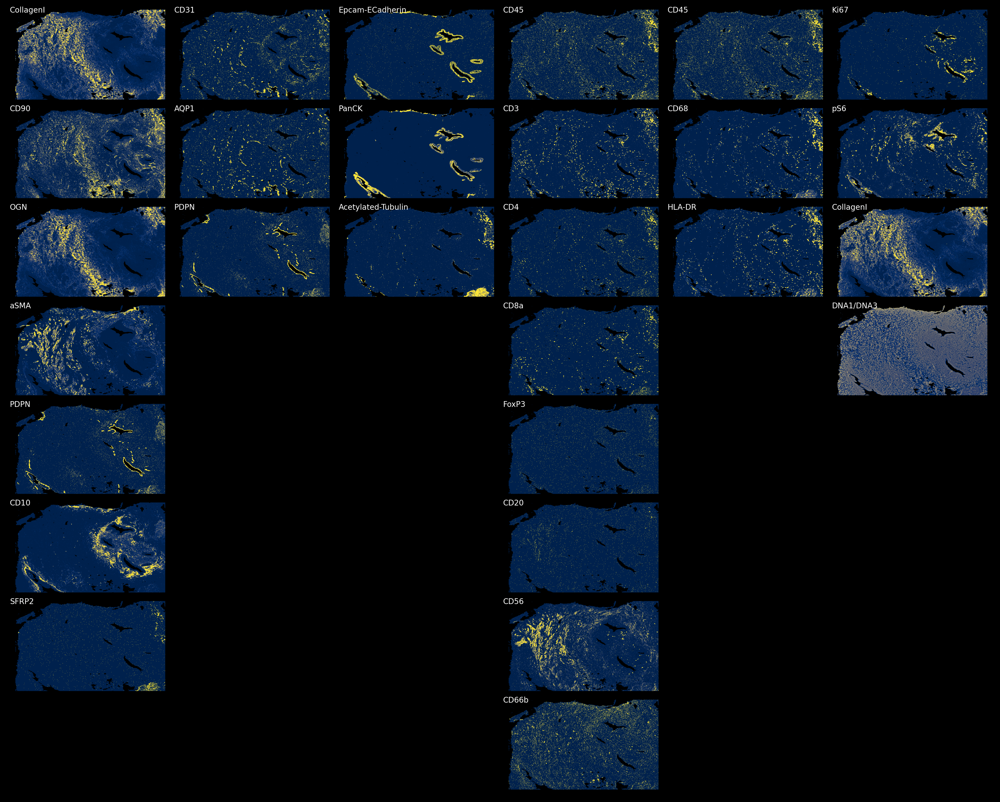

In [254]:
fig, axs = plt.subplots(8, 6, figsize=(3*6, 2*8), 
                        gridspec_kw={"left": 0, "right": 1, "bottom": 0, "top": 0.9, "hspace":0, "wspace":0}, 
                        facecolor="black")
for ax in axs.flat:
    ax.set_axis_off()
for k, (label, gene_list) in enumerate(gene_sets.items()):
    for i, gene in enumerate(gene_list):
        ax = axs[i, k]
        ax.set_axis_on()
        ax.set_facecolor("black")
        if i == 0:
            ax.set_title(label, color="white")

        if gene == "DNA1/DNA3":
            _ = sc.get.obs_df(adata, ["DNA1", "DNA3"], layer="vst")
            adata.obs["DNA1/DNA3"] = _["DNA1"] + _["DNA3"]
            
        sc.pl.scatter(adata, color=gene, layers="dog", 
                      basis="spatial", title="", show=False, ax=ax, size=0.5, color_map="cividis", legend_loc="none",)
        ax.invert_yaxis()
        ax.set_xlabel(""); ax.set_ylabel("");
        ax.text(0.01, 0.99, gene, transform=ax.transAxes, va="top", ha="left", color="white")
        fig.get_children()[-1].remove()
    print(f"{label} plotted")
print("saving...")
fig.savefig("endo-imc-draft-v1.png", dpi=400)

Stromal cells plotted
Endothelial cells plotted
Epithelial cells plotted
Lymphocytes cells plotted
Myeloid cells plotted
Other plotted
saving...


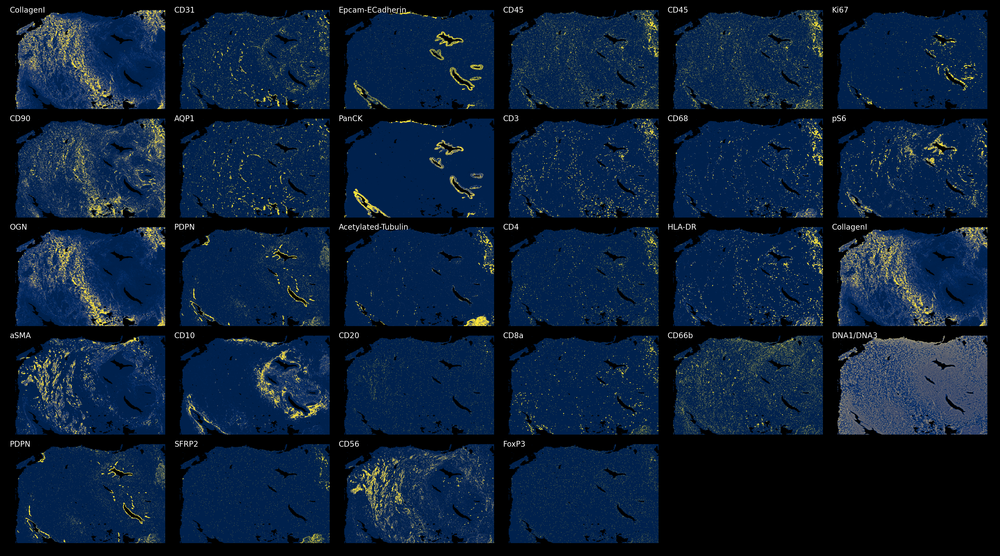

In [257]:
gene_sets2 = {
    "Stromal cells": ["CollagenI", "CD90", "OGN", "aSMA", "PDPN", ],
    "Endothelial cells": ["CD31", "AQP1", "PDPN", "CD10", "SFRP2"],
    "Epithelial cells": ["Epcam-ECadherin", "PanCK", "Acetylated-Tubulin", "CD20", "CD56",],
    "Lymphocytes cells": ["CD45", "CD3", "CD4", "CD8a", "FoxP3",  ],
    "Myeloid cells": ["CD45", "CD68", "HLA-DR", "CD66b"],#, "CD1c", "CD207"],
    "Other": ["Ki67", "pS6", "CollagenI", "DNA1/DNA3"],
}
fig, axs = plt.subplots(5, 6, figsize=(3*6, 2*5+1), 
                        gridspec_kw={"left": 0, "right": 1, "bottom": 0, "top": 0.9, "hspace":0, "wspace":0}, 
                        facecolor="black")
for ax in axs.flat:
    ax.set_axis_off()
for k, (label, gene_list) in enumerate(gene_sets2.items()):
    for i, gene in enumerate(gene_list):
        ax = axs[i, k]
        ax.set_axis_on()
        ax.set_facecolor("black")
        if i == 0:
            ax.set_title(label, color="white")

        if gene == "DNA1/DNA3":
            _ = sc.get.obs_df(adata, ["DNA1", "DNA3"], layer="vst")
            adata.obs["DNA1/DNA3"] = _["DNA1"] + _["DNA3"]
            
        sc.pl.scatter(adata, color=gene, layers="dog", 
                      basis="spatial", title="", show=False, ax=ax, size=0.5, color_map="cividis", legend_loc="none",)
        ax.invert_yaxis()
        ax.set_xlabel(""); ax.set_ylabel("");
        ax.text(0.01, 0.99, gene, transform=ax.transAxes, va="top", ha="left", color="white")
        fig.get_children()[-1].remove()
    print(f"{label} plotted")
print("saving...")
fig.savefig("endo-imc-draft-v2.png", dpi=400)

### Napari functions (maybe helpful?)

In [2]:
from pathlib import Path
import imageio
def save_imc_layers(viewer, outdir):
    for layer in viewer.layers:
        is_imc = layer.metadata.get("imc_acquisition_layer", False)
        if not is_imc: continue
        channel = layer.metadata.get("channel", None)
        if channel is None: continue
            
        fpath, ac = Path(layer.metadata.get("imc_file_acquisition")).stem.split(" ")
        fname = Path(fpath).stem
        outpath = Path(outdir) / ("_".join([fname, ac, channel]) + ".png")
        
        normed = normalized_data = (layer.data - layer.contrast_limits[0]) / (
            layer.contrast_limits[1] - layer.contrast_limits[0]
        )
        colormapped_data = layer.colormap.map(normalized_data.flatten())
        colormapped_data = colormapped_data.reshape(normalized_data.shape + (4,))
        colormapped_data[..., 3] = 1
        
        imageio.imsave(outpath, colormapped_data)

In [ ]:
import xtiff
from pathlib import Path
def save_as_multichannel(viewer, outfile):
    fpath, ac = viewer.layers[0].metadata.get("imc_file_acquisition").split(" ")
    fname = Path(fpath).stem
    img_name = "_".join([fname, ac])
    img_data = np.dstack([layer.data for layer in viewer.layers])
    channels = [layer.metadata.get("channel", "None") for layer in viewer.layers]
    xtiff.to_tiff(np.rollaxis(img_data, 2, 0), outfile, channel_names=channels, image_name=img_name)